# Rebalancing Optimal Weighted Portfolio

In this project file we will perform a portfolio analysis against a benchmark, including 5 predefined assets, optimizing weights semi-annualy by generating 1,000 different weight scenarios and choosing the optimal weights based on historical returns adjusted for risk (Sharpe Ratio). 

This will be done following these steps:

1. Importing relevant libraries.
2. Define the assets, initial weights, and initial capital for investment.
3. Import data from yahoo finance (or other) and calculate initial shares.
4. Calculate and define initial variables for rebalancing engine.
5. Create the rebalancing engine.
6. Calculate additional columns within main DataFrame for upcoming illustrative analysis.
7. Portfolio analysis.
8. Benchmark integration and further Portfolio analysis.

### 1. Select and Import libraries

In [1]:
# Selecting libraries

import yfinance as yf
import pandas as pd
import numpy as np
import random                                   
import pyfolio as py
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import warnings
warnings.filterwarnings("ignore")

C:\ProgramData\anaconda3\Lib\site-packages\pyfolio\pos.py:26: UserWarning: Module "zipline.assets" not found; mutltipliers will not be applied to position notionals.
  warnings.warn(


### 2. Define assets and key initial metrics

In [2]:
stocks = ['SPY', '^TNX', 'TIP', 'GLD', 'DBC' ]  # Assets to select (in yfinance format)

weights = [0.30 , 0.15, 0.40, 0.075, 0.075]     # Initial weights based on Ray Dalio's "All Weather Portfolio Allocation "

start_date = '2010-01-01'                       # Start date for testing
live_date = '2020-01-01'                        # Start date for live data 

benchmark = '^GSPC'                             # ^GSPC --> SP500 for Yfinance library

portfolio_value = 10**6                         # Initial Portfolio Value to be allocated in full

### 3. Import data and calculate initial shares

In [3]:
# Stock data for portfolio testing
stock_data = yf.download(stocks, start=start_date)['Adj Close'] 
stock_data = stock_data.dropna()
stock_data = stock_data.reindex(columns=stocks)
stock_prices = stock_data[stocks].values
stock_returns = stock_data.pct_change().apply(lambda x: np.log(1+x))

shares_df = pd.DataFrame(index=[stock_data.index[0]])

for s,w in zip(stocks, weights):
    shares_df[s + '_shares'] = np.floor((portfolio_value * np.array(w)) / stock_data[s][0])

shares_df

[*********************100%%**********************]  5 of 5 completed


,SPY_shares,^TNX_shares,TIP_shares,GLD_shares,DBC_shares
2010-01-04,3429.0,39052.0,5391.0,683.0,3076.0


### 4. Calculating initial variables for rebalancing function

In [4]:
# Set initial shares on the first day
shares_df.loc[stock_data.index[0], :] = [np.floor((portfolio_value * w) / stock_data[s][0]) for s,w in zip(stocks, weights)]

# Define semester change formula for rebalancing purposes
def semester(month):
    if month > 6:
        return 2
    else:
        return 1

# Initialize variables
balance_sem = semester(stock_data.index[0].month)
signal = False
count = 0    # for loop count purpose

# Store previous values in a dictionary
prev_values = {}

# Calculate portfolio value for the first day
portfolio_value = sum([shares_df.loc[stock_data.index[0], s + '_shares'] * stock_data.loc[stock_data.index[0], s] for s in stocks])

print('Initial portfolio value is ', portfolio_value)
print('Rounding of shares will not allow portfolio value to be equal to initial investment.')

Initial portfolio value is  999910.3421230316
Rounding of shares will not allow portfolio value to be equal to initial investment.


### 5. Create the rebalancing engine

In [5]:
for day in stock_data.index:
    count += 1
    if day == stock_data.index[0]:
        shares_df.loc[day] = shares_df.loc[day] # First day

        # Store initial values as previous values
        for col in shares_df.columns:
            prev_values[col] = shares_df.loc[day, col]


    elif semester(day.month) != balance_sem:
        signal = True
        
        random.seed(0)             # Generate a random method and keep it throughout the model
        np.random.seed(0)

        # Define the number of scenarios and create a blank array to populate stock weightings for each scenario
        scenarios = 10**3

        weights_array = np.zeros((scenarios, len(stocks)))

        # Create additional blank arrays for scenario output
        returns_array = np.zeros(scenarios)
        volatility_array = np.zeros(scenarios)
        sharpe_array = np.zeros(scenarios)
        
        # Create date stamps for DataFrame slicing, used for rolling 6-month historical returns 
        current_day_index = stock_data.index.get_loc(day)
        last_6month_index = max(stock_data.index.get_loc(day) - 126, 0)        
        
        for index in range(scenarios): 
            # Generate n random numbers for each asset
            numbers = np.array(np.random.random(len(stocks)))

            # Divide each number by the sum of the numbers to generate the random weight
            w_opt = numbers / numbers.sum()
            w_opt = np.round(w_opt, 3)

            # Save the weights in weights_array
            weights_array[index,:] = w_opt

            # Calculate the estimated portfolio return for each scenario
            returns_array[index] = np.sum(stock_returns.iloc[last_6month_index:current_day_index].mean()*252*w_opt)

            # Calculate the expected portfolio volatility for each scenario
            volatility_array[index] = np.sqrt(np.dot(w_opt.T,np.dot(stock_returns.iloc[last_6month_index:current_day_index].cov()*252, w_opt)))

            # Calculate the Sharpe Ratio for each scenario 
            sharpe_array[index] = returns_array[index]  / volatility_array[index]

            # Identify Optimal weights and reinstantiate "weights" variable
            index_max_sharpe = sharpe_array.argmax()
            weights = weights_array[index_max_sharpe,:]

        # Calculate new shares based on current portfolio and new optimal weights      
        new_shares = [np.floor((portfolio_value * w) / stock_data[s][day]) for s,w in zip(stocks, weights)]
        shares_df.loc[day, :] = new_shares
        
        # Reinstantiate "balance_sem" variable
        balance_sem = semester(day.month)
        count += 1
        
        # Store new values as previous values
        for col in shares_df.columns:
            prev_values[col] = shares_df.loc[day, col]

    else:

        signal = False

        # Use previous values if it is not a rebalancing date
        shares_df.loc[day, :] = [prev_values[col] for col in shares_df.columns]


    # Calculate asset values and portfolio value for the current day
    asset_values = [shares_df.loc[day, s + '_shares'] * stock_data.loc[day, s] for s in stocks]
    portfolio_value = sum(asset_values)
    
    stock_data.loc[day, 'Signal'] = signal
    stock_data.loc[day, 'Portfolio_Value'] = portfolio_value
    
    # Add shares to stock data frame
    for s in stocks:
        stock_data.loc[day, s + '_shares'] = shares_df.loc[day, s + '_shares']
        stock_data.loc[day, s + '_value'] = shares_df.loc[day, s + '_shares'] * stock_data.loc[day, s]

### 6. Calculate additional columns: logarithimc returns for portfolio values and weight per asset 

In [6]:
# Calculate log returns for portfolio
stock_data['Portfolio_Value_rets'] = np.log(stock_data['Portfolio_Value'] / stock_data['Portfolio_Value'].shift(1))

# Calculate log returns for each stock
for stock in stocks:
    stock_data[f'{stock}_rets'] = np.log(stock_data[stock] / stock_data[stock].shift(1))
    
# Calculate daily weight per asset
for s in stocks:
    stock_data[s + '_weight'] = stock_data[s + '_value'] / stock_data['Portfolio_Value']
    
stock_data.filter(regex='weight')
stock_data.query("Signal == True")

,SPY,^TNX,TIP,GLD,DBC,Signal,Portfolio_Value,SPY_shares,SPY_value,^TNX_shares,...,SPY_rets,^TNX_rets,TIP_rets,GLD_rets,DBC_rets,SPY_weight,^TNX_weight,TIP_weight,GLD_weight,DBC_weight
Date,,,,,,,,,,,,,,,,,,,,,
2010-07-01,80.029488,2.927,76.691170,117.040001,20.513208,True,9.528383e+05,464.0,3.713368e+04,7821.0,...,-0.004466,-0.008166,-0.005728,-0.038879,-0.015417,0.038972,0.024025,0.457489,0.407437,0.072078
2011-01-03,99.999382,3.342,78.205719,138.000000,26.723188,True,1.068197e+06,2561.0,2.560984e+05,17246.0,...,0.010285,0.011133,-0.004194,-0.005204,0.004346,0.239748,0.053956,0.354716,0.195722,0.155857
2011-07-01,106.389435,3.197,82.893196,144.929993,28.007677,True,1.119392e+06,3051.0,3.245942e+05,8054.0,...,0.014668,0.012274,0.001137,-0.007356,0.001380,0.289974,0.023002,0.561018,0.029002,0.097004
2012-01-03,102.458939,1.960,88.945633,155.919998,26.694214,True,1.130126e+06,430.0,4.405734e+04,13853.0,...,0.015810,0.046471,-0.000343,0.025528,0.029371,0.038984,0.024026,0.457507,0.407416,0.072066
2012-07-02,110.751030,1.580,92.660591,155.089996,24.820599,True,1.141877e+06,2990.0,3.311456e+05,16625.0,...,0.003008,-0.048790,0.002126,-0.000645,-0.001944,0.290001,0.023004,0.561055,0.028930,0.097011
2013-01-02,119.976517,1.839,94.613525,163.169998,26.926001,True,1.187536e+06,2870.0,3.443326e+05,14854.0,...,0.025308,0.046183,-0.000576,0.007073,0.003593,0.289956,0.023003,0.561051,0.028992,0.096999
2013-07-01,133.838165,2.490,87.964638,121.129997,24.424627,True,1.165999e+06,3720.0,4.978780e+05,161583.0,...,0.005843,0.004831,0.001420,0.016817,0.006347,0.426997,0.345062,0.150958,0.004986,0.071996
2014-01-02,153.288132,2.985,86.914040,118.000000,24.424627,True,1.328540e+06,4715.0,7.227535e+05,61876.0,...,-0.009630,-0.013642,0.003271,0.016060,-0.014524,0.544021,0.139025,0.196001,0.009948,0.111006
2014-07-01,166.635773,2.563,91.297173,127.699997,25.593222,True,1.379832e+06,2186.0,3.642658e+05,7000.0,...,0.006671,0.018508,-0.003973,-0.002659,-0.003014,0.263993,0.013002,0.487044,0.145947,0.090014


### 7. Preliminary Portfolio analysis

In [7]:
fig = go.Figure()

# Loop through each stock and add a trace for its shares
for stock in stocks:
    fig.add_trace(go.Scatter(x=stock_data.index, y=shares_df[stock+'_shares'], mode='lines', name=stock+'_shares'))

fig.update_layout(title='Shares per day',
                  xaxis_title='Date',
                  yaxis_title='Shares',
                  width=800,
                  height=400)

fig.show()

In [8]:
fig = go.Figure()

# Loop through each stock and add a trace for its shares
for stock in stocks:
    fig.add_trace(go.Scatter(x=stock_data.index, y=stock_data[stock + '_weight'], mode='lines', name=stock + '_weight'))

fig.update_layout(title='Weights per day',
                  xaxis_title='Date',
                  yaxis_title='Weights',
                  width=1000,
                  height=600)

In [9]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# Create subplot layout
fig = make_subplots(rows=2, cols=2, subplot_titles=('Portfolio Returns', 'Asset Returns', 'Shares Holding per Asset', 'Weights per Asset'))

# Add traces to the subplots
fig.add_trace(go.Scatter(x=stock_data.index, y=stock_data['Portfolio_Value_rets'].cumsum(), name='Portfolio'), row=1, col=1)

for s in stocks:
    fig.add_trace(go.Scatter(x=stock_data.index, y=stock_data[f'{s}_rets'].cumsum(), name=f'{s}'), row=1, col=2)
    fig.add_trace(go.Scatter(x=shares_df.index, y=shares_df[f'{s}_shares'], name=f'{s}'), row=2, col=1)
    fig.add_trace(go.Scatter(x=stock_data.index, y=stock_data[f'{s}_weight'], name=f'{s}'), row=2, col=2)

# Update subplot layout
fig.update_layout(height=800, width=1200, title='Strategy Overview', showlegend=False)

# Display the plot
fig.show()

### 8. Benchmark Integration and further analysis

[*********************100%%**********************]  1 of 1 completed


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,17.80,2020-02-21,2020-03-19,2020-07-06,97
1,13.22,2022-03-25,2022-08-01,2022-09-22,130
2,12.37,2014-06-20,2016-02-11,2017-11-22,894
3,12.34,2022-11-07,2022-12-07,2023-07-18,182
4,8.04,2010-04-23,2010-07-27,2010-10-05,118


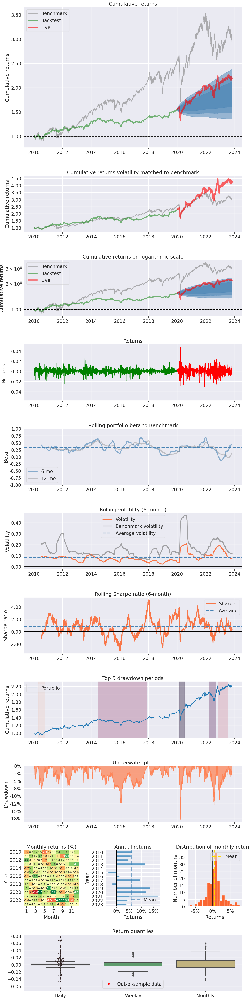

In [10]:
# Benchmark data download and returns
start_date_benchmark = stock_data.index[0]
benchmark_data = yf.download(benchmark, start=start_date_benchmark)
benchmark_data = benchmark_data.dropna()
benchmark_data['Benchmark'] = np.log(benchmark_data['Adj Close'] / benchmark_data['Adj Close'].shift(1))
benchmark_data['Benchmark'] = benchmark_data['Benchmark'].dropna()

# Data timezone unification for pyfolio valuation
stock_data.index = stock_data.index.tz_localize('UTC')
benchmark_data.index = benchmark_data.index.tz_localize('UTC')
live_date = pd.Timestamp(live_date, tz='UTC')

py.create_full_tear_sheet(stock_data['Portfolio_Value_rets'], benchmark_rets = benchmark_data['Benchmark'], live_start_date = live_date)